In [1]:
import os
import torch
import numpy as np
torch.manual_seed(2022201)
np.random.seed(2022201)
import pandas as pd
import matplotlib.pyplot as plt
from torch.utils.data import Dataset, DataLoader
from torchvision import transforms
from PIL import Image

class CamVidDataset(Dataset):
    def __init__(self, image_dir, mask_dir, class_dict_path, transform=None, preload=True):
        self.image_dir = image_dir
        self.mask_dir = mask_dir
        self.transform = transform
        self.preload = preload
        self.class_dict = pd.read_csv(class_dict_path)
        self.images = os.listdir(image_dir)
        
        # Load class mapping
        self.color_to_label = {
            tuple(self.class_dict.iloc[i, 1:4].astype(int)): i 
            for i in range(len(self.class_dict))
        }

        self.mask_transform = transforms.Compose([
            transforms.Resize((360, 480), interpolation=Image.NEAREST)
        ])

        # Preload data into RAM if preload=True
        if self.preload:
            self.preloaded_data = []
            for img_name in self.images:
                self.preloaded_data.append(self.process_image_mask(img_name))

    def __len__(self):
        return len(self.images)

    def encode_mask(self, mask):
        mask = np.array(mask, dtype=np.uint8)
        label_mask = np.zeros(mask.shape[:2], dtype=np.int64)
        for color, label in self.color_to_label.items():
            label_mask[(mask == color).all(axis=-1)] = label
        return torch.tensor(label_mask, dtype=torch.long)
    
    def process_image_mask(self, img_name): 
        img_path = os.path.join(self.image_dir, img_name)
        mask_path = os.path.join(self.mask_dir, img_name.replace('.png', '_L.png'))
        
        image = Image.open(img_path).convert("RGB")
        mask = Image.open(mask_path).convert("RGB")
        
        if self.transform:
            image = self.transform(image)
        
        mask = self.mask_transform(mask)
        mask = self.encode_mask(mask)
        
        return image, mask

    def __getitem__(self, idx):
        return self.preloaded_data[idx] if self.preload else self.process_image_mask(self.images[idx])

    def visualize_sample(self, idx):
        img_path = os.path.join(self.image_dir, self.images[idx])
        mask_path = os.path.join(self.mask_dir, self.images[idx].replace('.png', '_L.png'))
        
        image = Image.open(img_path).convert("RGB")
        mask = Image.open(mask_path).convert("RGB")
        
        fig, axes = plt.subplots(1, 2, figsize=(8, 5))
        axes[0].imshow(image)  
        axes[0].set_title("Image")
        axes[0].axis("off")
        
        axes[1].imshow(mask) 
        axes[1].set_title("Mask")
        axes[1].axis("off")
        
        plt.show()


# Define transforms
transform = transforms.Compose([
    transforms.Resize((360, 480)),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
])

# Initialize dataset
train_dataset = CamVidDataset(
    image_dir="/kaggle/input/cv-hw1-2022201/data/CamVid/CamVid/train",
    mask_dir="/kaggle/input/cv-hw1-2022201/data/CamVid/CamVid/train_labels",
    class_dict_path="/kaggle/input/cv-hw1-2022201/data/CamVid/CamVid/class_dict.csv",
    transform=transform,
    preload=True
)

test_dataset = CamVidDataset(
    image_dir="/kaggle/input/cv-hw1-2022201/data/CamVid/CamVid/test_images",
    mask_dir="/kaggle/input/cv-hw1-2022201/data/CamVid/CamVid/test_labels",
    class_dict_path="/kaggle/input/cv-hw1-2022201/data/CamVid/CamVid/class_dict.csv",
    transform=transform,
    preload=True
) 

# Create DataLoader
train_loader = DataLoader(train_dataset, batch_size=10, shuffle=True, num_workers=2)
test_loader = DataLoader(test_dataset, batch_size=10, shuffle=False, num_workers=2)

# Dataset Sizes
print(f"Train Dataset Size: {len(train_dataset)}")
print(f"Test Dataset Size: {len(test_dataset)}")

Train Dataset Size: 369
Test Dataset Size: 232


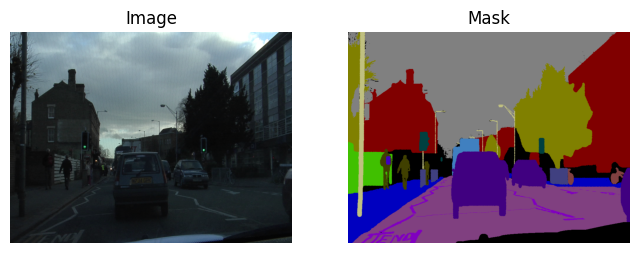

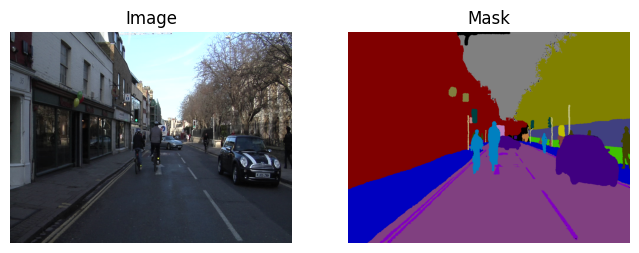

In [2]:
train_dataset.visualize_sample(0)
train_dataset.visualize_sample(1)

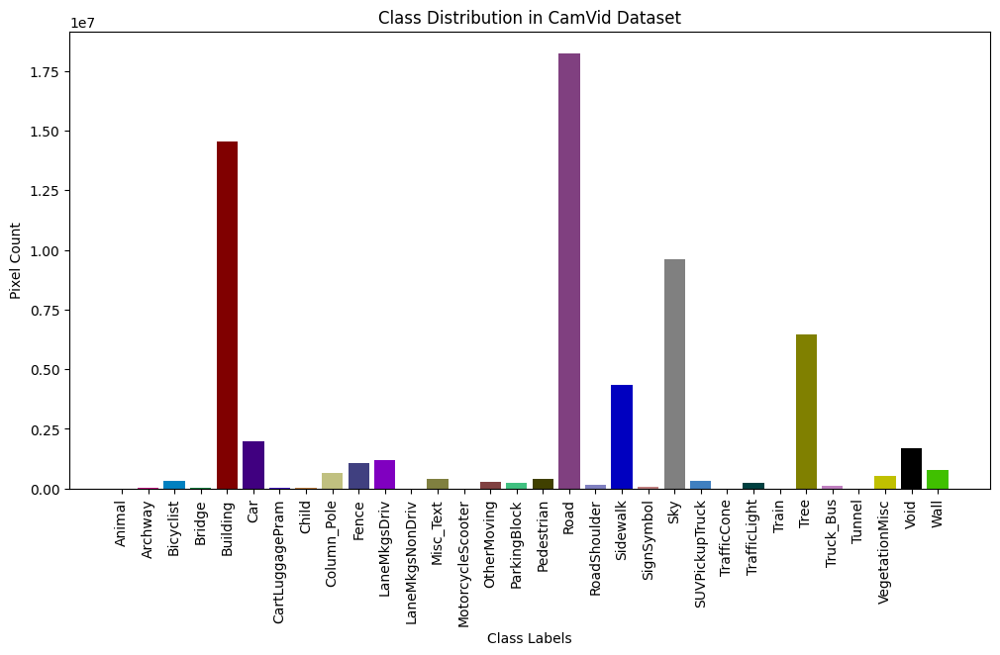

In [3]:
from collections import Counter

def visualize_class_distribution(dataset):
    # Initialize counter with all possible class labels
    class_counts = Counter({label: 0 for label in dataset.color_to_label.values()})
    
    for _, mask in dataset:
        unique, counts = np.unique(mask.numpy(), return_counts=True)
        class_counts.update(dict(zip(unique, counts)))
    
    classes = list(class_counts.keys())
    counts = list(class_counts.values())

    # Get class names and colors based on label index
    class_names = [dataset.class_dict['name'].iloc[c] for c in classes]
    class_colors = [np.array(color) / 255.0 for color, label in dataset.color_to_label.items() if label in classes]
    plt.figure(figsize=(12, 6))
    plt.bar(classes, counts, tick_label=class_names, color=class_colors)
    plt.xlabel("Class Labels")
    plt.ylabel("Pixel Count")
    plt.xticks(rotation=90)
    plt.title("Class Distribution in CamVid Dataset")
    plt.show()

# Visualize class distribution
visualize_class_distribution(train_dataset)

In [4]:
import torch
import torch.nn as nn
import torch.nn.functional as F
import torchvision
from torchvision import models,transforms
import torch.optim as optim

class SegNet_Encoder(nn.Module):

    def __init__(self, in_chn=3, out_chn=32, BN_momentum=0.5):
        super(SegNet_Encoder, self).__init__()

        #SegNet Architecture
        #Takes input of size in_chn = 3 (RGB images have 3 channels)
        #Outputs size label_chn (N # of classes)

        #ENCODING consists of 5 stages
        #Stage 1, 2 has 2 layers of Convolution + Batch Normalization + Max Pool respectively
        #Stage 3, 4, 5 has 3 layers of Convolution + Batch Normalization + Max Pool respectively

        #General Max Pool 2D for ENCODING layers
        #Pooling indices are stored for Upsampling in DECODING layers

        self.in_chn = in_chn
        self.out_chn = out_chn

        self.MaxEn = nn.MaxPool2d(2, stride=2, return_indices=True) 

        self.ConvEn11 = nn.Conv2d(self.in_chn, 64, kernel_size=3, padding=1)
        self.BNEn11 = nn.BatchNorm2d(64, momentum=BN_momentum)
        self.ConvEn12 = nn.Conv2d(64, 64, kernel_size=3, padding=1)
        self.BNEn12 = nn.BatchNorm2d(64, momentum=BN_momentum)

        self.ConvEn21 = nn.Conv2d(64, 128, kernel_size=3, padding=1)
        self.BNEn21 = nn.BatchNorm2d(128, momentum=BN_momentum)
        self.ConvEn22 = nn.Conv2d(128, 128, kernel_size=3, padding=1)
        self.BNEn22 = nn.BatchNorm2d(128, momentum=BN_momentum)

        self.ConvEn31 = nn.Conv2d(128, 256, kernel_size=3, padding=1)
        self.BNEn31 = nn.BatchNorm2d(256, momentum=BN_momentum)
        self.ConvEn32 = nn.Conv2d(256, 256, kernel_size=3, padding=1)
        self.BNEn32 = nn.BatchNorm2d(256, momentum=BN_momentum)
        self.ConvEn33 = nn.Conv2d(256, 256, kernel_size=3, padding=1)
        self.BNEn33 = nn.BatchNorm2d(256, momentum=BN_momentum)

        self.ConvEn41 = nn.Conv2d(256, 512, kernel_size=3, padding=1)
        self.BNEn41 = nn.BatchNorm2d(512, momentum=BN_momentum)
        self.ConvEn42 = nn.Conv2d(512, 512, kernel_size=3, padding=1)
        self.BNEn42 = nn.BatchNorm2d(512, momentum=BN_momentum)
        self.ConvEn43 = nn.Conv2d(512, 512, kernel_size=3, padding=1)
        self.BNEn43 = nn.BatchNorm2d(512, momentum=BN_momentum)

        self.ConvEn51 = nn.Conv2d(512, 512, kernel_size=3, padding=1)
        self.BNEn51 = nn.BatchNorm2d(512, momentum=BN_momentum)
        self.ConvEn52 = nn.Conv2d(512, 512, kernel_size=3, padding=1)
        self.BNEn52 = nn.BatchNorm2d(512, momentum=BN_momentum)
        self.ConvEn53 = nn.Conv2d(512, 512, kernel_size=3, padding=1)
        self.BNEn53 = nn.BatchNorm2d(512, momentum=BN_momentum)

    def forward(self,x):
        #ENCODE LAYERS
        #Stage 1
        x = F.relu(self.BNEn11(self.ConvEn11(x))) 
        x = F.relu(self.BNEn12(self.ConvEn12(x))) 
        x, ind1 = self.MaxEn(x)
        size1 = x.size()

        #Stage 2
        x = F.relu(self.BNEn21(self.ConvEn21(x))) 
        x = F.relu(self.BNEn22(self.ConvEn22(x))) 
        x, ind2 = self.MaxEn(x)
        size2 = x.size()

        #Stage 3
        x = F.relu(self.BNEn31(self.ConvEn31(x))) 
        x = F.relu(self.BNEn32(self.ConvEn32(x))) 
        x = F.relu(self.BNEn33(self.ConvEn33(x)))   
        x, ind3 = self.MaxEn(x)
        size3 = x.size()

        #Stage 4
        x = F.relu(self.BNEn41(self.ConvEn41(x))) 
        x = F.relu(self.BNEn42(self.ConvEn42(x))) 
        x = F.relu(self.BNEn43(self.ConvEn43(x)))   
        x, ind4 = self.MaxEn(x)
        size4 = x.size()

        #Stage 5
        x = F.relu(self.BNEn51(self.ConvEn51(x))) 
        x = F.relu(self.BNEn52(self.ConvEn52(x))) 
        x = F.relu(self.BNEn53(self.ConvEn53(x)))   
        x, ind5 = self.MaxEn(x)
        size5 = x.size()
        return x,[ind1,ind2,ind3,ind4,ind5],[size1,size2,size3,size4,size5]


class SegNet_Decoder(nn.Module):

    def __init__(self, in_chn=3, out_chn=32, BN_momentum=0.5):
        super(SegNet_Decoder, self).__init__()
        self.in_chn = in_chn
        self.out_chn = out_chn

        #DECODING consists of 5 stages
        #Each stage corresponds to their respective counterparts in ENCODING

        #General Max Pool 2D/Upsampling for DECODING layers
        self.MaxDe = nn.MaxUnpool2d(2, stride=2) 

        self.ConvDe53 = nn.Conv2d(512, 512, kernel_size=3, padding=1)
        self.BNDe53 = nn.BatchNorm2d(512, momentum=BN_momentum)
        self.ConvDe52 = nn.Conv2d(512, 512, kernel_size=3, padding=1)
        self.BNDe52 = nn.BatchNorm2d(512, momentum=BN_momentum)
        self.ConvDe51 = nn.Conv2d(512, 512, kernel_size=3, padding=1)
        self.BNDe51 = nn.BatchNorm2d(512, momentum=BN_momentum)

        self.ConvDe43 = nn.Conv2d(512, 512, kernel_size=3, padding=1)
        self.BNDe43 = nn.BatchNorm2d(512, momentum=BN_momentum)
        self.ConvDe42 = nn.Conv2d(512, 512, kernel_size=3, padding=1)
        self.BNDe42 = nn.BatchNorm2d(512, momentum=BN_momentum)
        self.ConvDe41 = nn.Conv2d(512, 256, kernel_size=3, padding=1)
        self.BNDe41 = nn.BatchNorm2d(256, momentum=BN_momentum)

        self.ConvDe33 = nn.Conv2d(256, 256, kernel_size=3, padding=1)
        self.BNDe33 = nn.BatchNorm2d(256, momentum=BN_momentum)
        self.ConvDe32 = nn.Conv2d(256, 256, kernel_size=3, padding=1)
        self.BNDe32 = nn.BatchNorm2d(256, momentum=BN_momentum)
        self.ConvDe31 = nn.Conv2d(256, 128, kernel_size=3, padding=1)
        self.BNDe31 = nn.BatchNorm2d(128, momentum=BN_momentum)

        self.ConvDe22 = nn.Conv2d(128, 128, kernel_size=3, padding=1)
        self.BNDe22 = nn.BatchNorm2d(128, momentum=BN_momentum)
        self.ConvDe21 = nn.Conv2d(128, 64, kernel_size=3, padding=1)
        self.BNDe21 = nn.BatchNorm2d(64, momentum=BN_momentum)

        self.ConvDe12 = nn.Conv2d(64, 64, kernel_size=3, padding=1)
        self.BNDe12 = nn.BatchNorm2d(64, momentum=BN_momentum)
        self.ConvDe11 = nn.Conv2d(64, self.out_chn, kernel_size=3, padding=1)
        self.BNDe11 = nn.BatchNorm2d(self.out_chn, momentum=BN_momentum) 

    def forward(self,x,indexes,sizes):
        ind1, ind2, ind3, ind4, ind5 = indexes
        size1, size2, size3, size4, size5 = sizes

        #DECODE LAYERS
        #Stage 5
        x = self.MaxDe(x, ind5, output_size=size4)
        x = F.relu(self.BNDe53(self.ConvDe53(x)))
        x = F.relu(self.BNDe52(self.ConvDe52(x)))
        x = F.relu(self.BNDe51(self.ConvDe51(x)))

        #Stage 4
        x = self.MaxDe(x, ind4, output_size=size3)
        x = F.relu(self.BNDe43(self.ConvDe43(x)))
        x = F.relu(self.BNDe42(self.ConvDe42(x)))
        x = F.relu(self.BNDe41(self.ConvDe41(x)))

        #Stage 3
        x = self.MaxDe(x, ind3, output_size=size2)
        x = F.relu(self.BNDe33(self.ConvDe33(x)))
        x = F.relu(self.BNDe32(self.ConvDe32(x)))
        x = F.relu(self.BNDe31(self.ConvDe31(x)))

        #Stage 2
        x = self.MaxDe(x, ind2, output_size=size1)
        x = F.relu(self.BNDe22(self.ConvDe22(x)))
        x = F.relu(self.BNDe21(self.ConvDe21(x)))

        #Stage 1
        x = self.MaxDe(x, ind1)
        x = F.relu(self.BNDe12(self.ConvDe12(x)))
        x = self.ConvDe11(x)
        # Batchnorm (and likewise dropout) is not applied after the final layer of a conv net -- reason being that 
        # the penultimate layer produces the final class logits, and BN would normalize these logits, which could potentially 
        # distort the class probabilities, potentially impacting training.

        return x


class SegNet_Pretrained(nn.Module):

    def __init__(self,encoder_weight_pth,in_chn=3, out_chn=32):
        super(SegNet_Pretrained, self).__init__()
        self.in_chn = in_chn
        self.out_chn = out_chn
        self.encoder=SegNet_Encoder(in_chn=self.in_chn,out_chn=self.out_chn)
        self.decoder=SegNet_Decoder(in_chn=self.in_chn,out_chn=self.out_chn)
        encoder_state_dict = torch.load(encoder_weight_pth,weights_only=True)

        # Load weights into the encoder
        self.encoder.load_state_dict(encoder_state_dict)

        # Freeze encoder weights
        for param in self.encoder.parameters():
            param.requires_grad = False

    def forward(self,x):
        x,indexes,sizes=self.encoder(x)
        x=self.decoder(x,indexes,sizes)
        return x


class DeepLabV3(nn.Module):
    def __init__(self, num_classes=32):
        super(DeepLabV3, self).__init__()

        # Load Pretrained DeepLabV3 Model (trained on Pascal VOC)
        self.model = models.segmentation.deeplabv3_resnet50(weights='COCO_WITH_VOC_LABELS_V1')

        # Modify the classifier to match CamVid dataset (32 classes)
        in_features = self.model.classifier[4].in_channels  # Get input channels (usually 256)
        self.model.classifier[4] = nn.Conv2d(in_features, num_classes, kernel_size=1, stride=1)

    def forward(self, x):
        return self.model(x)['out']

In [5]:
import wandb
import numpy as np
from sklearn.metrics import confusion_matrix, accuracy_score, f1_score
from kaggle_secrets import UserSecretsClient

# Login to W&B
user_secrets = UserSecretsClient()
wandb_api = user_secrets.get_secret("WANDB_API_KEY")
wandb.login(key=wandb_api)

# Define Device (GPU if available, else CPU)
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

def train(model, train_loader, epochs=20, learning_rate=0.0002, model_name="Model"):
    """
    Train a given model and log metrics using Weights & Biases.
    """

    # Initialize WandB
    wandb.init(project="CV_A1_Segmentation", name=model_name)
    wandb.config.update({"epochs": epochs, "learning_rate": learning_rate})

    model = model.to(device)  # Move model to GPU/CPU
    model.train() # Set model to training mode
    criterion = nn.CrossEntropyLoss()  # Cross-Entropy Loss
    optimizer = optim.Adam(model.parameters(), lr=learning_rate)  # Adam Optimizer

    print(f"================================= TRAINING {model_name} =================================")
    for epoch in range(epochs):

        train_loss = 0.0
        for images, masks in train_loader:
            images, masks = images.to(device), masks.to(device)  # Move data to GPU/CPU

            # Forward pass
            outputs = model(images)
            loss = criterion(outputs, masks)

            # Backpropagation
            optimizer.zero_grad()
            loss.backward()
            optimizer.step()

            # Accumulate loss
            train_loss += loss.item() * images.size(0)

        train_loss/=len(train_loader.dataset)

        # Log to WandB
        wandb.log({"Train Loss": train_loss})

        print(f"Epoch [{epoch+1}/{epochs}] -> Train Loss: {train_loss:.4f}")
    
    print(f"================================= TRAINING COMPLETED =================================")
    wandb.finish()

wandb: Using wandb-core as the SDK backend.  Please refer to https://wandb.me/wandb-core for more information.
wandb: Currently logged in as: harshu04 (harshu04-indraprastha-institute-of-information-technolog). Use `wandb login --relogin` to force relogin
wandb: WARNING If you're specifying your api key in code, ensure this code is not shared publicly.
wandb: WARNING Consider setting the WANDB_API_KEY environment variable, or running `wandb login` from the command line.
wandb: Appending key for api.wandb.ai to your netrc file: /root/.netrc


In [6]:
from tqdm import tqdm
from sklearn.metrics import precision_score, recall_score

def compute_metrics(preds, labels, num_classes=32):
    """
    Compute pixel accuracy, IoU, Dice coefficient, precision, and recall for each class.
    """
    preds = preds.detach().cpu().numpy()  # Convert to numpy
    labels = labels.cpu().numpy()
    
    pixel_acc = np.mean(preds == labels)  # Overall Pixel Accuracy
    
    iou_per_class = []
    dice_per_class = []
    precision_per_class = []
    recall_per_class = []
    
    for cls in range(num_classes):
        label_mask = (labels == cls)
        pred_mask = (preds == cls)
        
        intersection = np.logical_and(pred_mask, label_mask).sum()
        union = np.logical_or(pred_mask, label_mask).sum()
        dice = (2.0 * intersection) / (pred_mask.sum() + label_mask.sum() + 1e-8)  # Avoid division by zero
        
        iou = intersection / (union + 1e-8)  # IoU
        precision = intersection / (pred_mask.sum() + 1e-8)
        recall = intersection / (label_mask.sum() + 1e-8)

        iou_per_class.append(iou)
        dice_per_class.append(dice)
        precision_per_class.append(precision)
        recall_per_class.append(recall)
    
    miou = np.mean(iou_per_class)  # Mean IoU
    
    return pixel_acc, iou_per_class, dice_per_class, precision_per_class, recall_per_class, miou


def evaluate_model(model, dataloader, num_classes=32):
    """
    Evaluate SegNet model on test dataset.
    """
    model.eval()
    model.to(device)
    
    all_preds = []
    all_labels = []
    
    with torch.no_grad():
        for images, masks in tqdm(dataloader, desc="Evaluating"):
            images, masks = images.to(device), masks.to(device)
            outputs = model(images)  # Forward pass
            
            preds = torch.argmax(outputs, dim=1)  # Get predicted class for each pixel

            all_labels.append(masks)
            all_preds.append(preds)
    
    # Stack all predictions and labels
    all_preds = torch.cat(all_preds, dim=0)
    all_labels = torch.cat(all_labels, dim=0)
    
    # Compute Metrics
    pixel_acc, iou_per_class, dice_per_class, precision_per_class, recall_per_class, miou = compute_metrics(all_preds, all_labels, num_classes)
    
    # Print Results
    print(f"\nPixel Accuracy: {pixel_acc:.4f}")
    print(f"Mean IoU (mIoU): {miou:.4f}\n")
    
    print("Class-wise Metrics:")
    for i in range(num_classes):
        print(f"Class {i}: IoU={iou_per_class[i]:.4f}, Dice={dice_per_class[i]:.4f}, Precision={precision_per_class[i]:.4f}, Recall={recall_per_class[i]:.4f}")

    return {
        "Pixel Accuracy": pixel_acc,
        "IoU Per Class": iou_per_class,
        "Dice Per Class": dice_per_class,
        "Precision Per Class": precision_per_class,
        "Recall Per Class": recall_per_class,
        "Mean IoU": miou
    }

In [7]:
import random 

def compute_iou_per_image(preds, labels, num_classes=32):
    """
    Compute per-image IoU for each class.
    """
    preds = preds.detach().cpu().numpy()
    labels = labels.cpu().numpy()
    
    iou_per_class_per_image = []
    
    for cls in range(num_classes):
        pred_mask = (preds == cls)
        label_mask = (labels == cls)

        intersection = np.logical_and(pred_mask, label_mask).sum(axis=(1, 2))  # Sum per image
        union = np.logical_or(pred_mask, label_mask).sum(axis=(1, 2))

        iou_per_image = intersection / (union + 1e-8)  # Avoid division by zero
        iou_per_class_per_image.append(iou_per_image)

    return np.array(iou_per_class_per_image)  # Shape: (num_classes, num_images)


def get_low_iou_samples(model, dataloader, num_classes):
    """
    Get samples where IoU ≤ 0.5 for each class.
    """
    model.eval()
    model.to(device)
    
    low_iou_samples = {cls: [] for cls in range(num_classes)}  # Store images with IoU ≤ 0.5
    
    all_images, all_preds, all_labels = [], [], []
    
    with torch.no_grad():
        for images, masks in tqdm(dataloader, desc="Finding Low IoU Samples"):
            images, masks = images.to(device), masks.to(device)
            outputs = model(images)
            preds = torch.argmax(outputs, dim=1)  # Get class index for each pixel
            
            all_images.append(images.cpu())
            all_labels.append(masks.cpu())
            all_preds.append(preds.cpu())
    
    # Stack all images, predictions, and labels
    all_images = torch.cat(all_images, dim=0)
    all_labels = torch.cat(all_labels, dim=0)
    all_preds = torch.cat(all_preds, dim=0)

    
    # Compute per-image IoU for each class
    iou_per_class_per_image = compute_iou_per_image(all_preds, all_labels, num_classes)
    
    # Store image indices where 0 < IoU ≤ 0.5  # IoU = 0 may mean cls was not present
    for cls in range(num_classes):
        low_iou_indices = np.where((0 < iou_per_class_per_image[cls]) & (iou_per_class_per_image[cls] <= 0.5))[0]
        
        if len(low_iou_indices) > 3:
            low_iou_indices = random.sample(list(low_iou_indices), 3)  # Randomly pick 3 samples
        
        for idx in low_iou_indices:
            low_iou_samples[cls].append((all_images[idx], all_preds[idx], all_labels[idx]))

    return low_iou_samples

def visualize_low_iou_samples(model, dataloader, num_classes=32):
    """
    Visualize three samples per class where IoU ≤ 0.5.
    """
    low_iou_samples = get_low_iou_samples(model, dataloader, num_classes)
    class_dict = dataloader.dataset.class_dict
    
    # Create label-to-color mapping {label_index: (r, g, b)}
    label_to_color = {i: tuple(class_dict.iloc[i, 1:4].astype(int)) for i in range(len(class_dict))}
    
    for cls, samples in low_iou_samples.items():

        print(f"\n============================= Class {cls} =============================")
        if len(samples) == 0:
            print("No Samples Available with 0 < IoU <= 0.5")
            continue  # Skip if No samples
        
        fig, axes = plt.subplots(len(samples), 3, figsize=(8, 2 * len(samples)))

        # Ensure `axes` is always a 2D array (even for 1 sample)
        if len(samples) == 1:
            axes = np.expand_dims(axes, axis=0)
        
        for i, (image, pred_mask, true_mask) in enumerate(samples):
            
            # Unnormalize the image
            mean = torch.tensor([0.485, 0.456, 0.406]).view(3, 1, 1)
            std = torch.tensor([0.229, 0.224, 0.225]).view(3, 1, 1)
            image = image * std + mean  # Reverse normalization
            image = torch.clamp(image, 0, 1).permute(1, 2, 0).cpu().numpy()  # Convert to HWC format

            # Convert masks to RGB using label_to_color mapping (original color code)
            true_mask = np.vectorize(label_to_color.get)(true_mask.cpu().numpy())
            pred_mask = np.vectorize(label_to_color.get)(pred_mask.cpu().numpy())

            # Reshape masks to (H, W, 3) for RGB visualization
            true_mask = np.stack(true_mask, axis=-1)
            pred_mask = np.stack(pred_mask, axis=-1)
            
            axes[i, 0].imshow(image)
            axes[i, 0].set_title(f"Original Image")
            axes[i, 0].axis("off")

            axes[i, 1].imshow(true_mask)  # Use color coding
            axes[i, 1].set_title(f"Ground Truth Mask")
            axes[i, 1].axis("off")

            axes[i, 2].imshow(pred_mask)
            axes[i, 2].set_title(f"Predicted Mask")
            axes[i, 2].axis("off")
        
        plt.show()

# SegNet Encoder-decoder : Training and Evaluation

In [8]:
# Load SegNet with Pretrained Encoder
segnet = SegNet_Pretrained(encoder_weight_pth="/kaggle/input/cv-hw1-2022201/Segmentation/encoder_model.pth", in_chn=3, out_chn=32)
train(segnet,train_loader,model_name="segnet")

# Save only decoder weights
torch.save(segnet.decoder.state_dict(), "decoder.pth")
print("Decoder saved successfully as decoder.pth")

================================= TRAINING segnet =================================
Epoch [1/20] -> Train Loss: 2.2558
Epoch [2/20] -> Train Loss: 1.0993
Epoch [3/20] -> Train Loss: 0.8367
Epoch [4/20] -> Train Loss: 0.7373
Epoch [5/20] -> Train Loss: 0.6747
Epoch [6/20] -> Train Loss: 0.6237
Epoch [7/20] -> Train Loss: 0.5817
Epoch [8/20] -> Train Loss: 0.5400
Epoch [9/20] -> Train Loss: 0.5114
Epoch [10/20] -> Train Loss: 0.4970
Epoch [11/20] -> Train Loss: 0.4687
Epoch [12/20] -> Train Loss: 0.4307
Epoch [13/20] -> Train Loss: 0.4084
Epoch [14/20] -> Train Loss: 0.3887
Epoch [15/20] -> Train Loss: 0.3666
Epoch [16/20] -> Train Loss: 0.3428
Epoch [17/20] -> Train Loss: 0.3251
Epoch [18/20] -> Train Loss: 0.3056
Epoch [19/20] -> Train Loss: 0.2917
Epoch [20/20] -> Train Loss: 0.2621
================================= TRAINING COMPLETED =================================


Train Loss,█▄▃▃▂▂▂▂▂▂▂▂▂▁▁▁▁▁▁▁
Train Loss,0.26206


Decoder saved successfully as decoder.pth


In [9]:
# # Load trained SegNet model
# segnet = SegNet_Pretrained(encoder_weight_pth="/kaggle/input/cv-hw1-2022201/Segmentation/encoder_model.pth", in_chn=3, out_chn=32)
# segnet.decoder.load_state_dict(torch.load("decoder.pth"))  # Load trained decoder weights

# Evaluate model
print("===== Evaluation Results on Test Set =====")
segnet_results = evaluate_model(segnet, test_loader, num_classes=32)

===== Evaluation Results on Test Set =====


Evaluating: 100%|██████████| 24/24 [00:05<00:00,  4.71it/s]



Pixel Accuracy: 0.8150
Mean IoU (mIoU): 0.2272

Class-wise Metrics:
Class 0: IoU=0.0000, Dice=0.0000, Precision=0.0000, Recall=0.0000
Class 1: IoU=0.0000, Dice=0.0000, Precision=0.0000, Recall=0.0000
Class 2: IoU=0.3223, Dice=0.4874, Precision=0.7264, Recall=0.3668
Class 3: IoU=0.0000, Dice=0.0000, Precision=0.0000, Recall=0.0000
Class 4: IoU=0.7550, Dice=0.8604, Precision=0.8510, Recall=0.8700
Class 5: IoU=0.6155, Dice=0.7620, Precision=0.7673, Recall=0.7568
Class 6: IoU=0.0000, Dice=0.0000, Precision=0.0000, Recall=0.0000
Class 7: IoU=0.0000, Dice=0.0000, Precision=0.0000, Recall=0.0000
Class 8: IoU=0.0523, Dice=0.0994, Precision=0.4449, Recall=0.0559
Class 9: IoU=0.2815, Dice=0.4393, Precision=0.4963, Recall=0.3941
Class 10: IoU=0.4408, Dice=0.6119, Precision=0.7384, Recall=0.5223
Class 11: IoU=0.0000, Dice=0.0000, Precision=0.0000, Recall=0.0000
Class 12: IoU=0.0317, Dice=0.0615, Precision=0.1046, Recall=0.0436
Class 13: IoU=0.0000, Dice=0.0000, Precision=0.0000, Recall=0.0000
Cla

Finding Low IoU Samples: 100%|██████████| 24/24 [00:06<00:00,  3.73it/s]



============================= Class 0 =============================
No Samples Available with 0 < IoU <= 0.5

============================= Class 1 =============================
No Samples Available with 0 < IoU <= 0.5

============================= Class 2 =============================


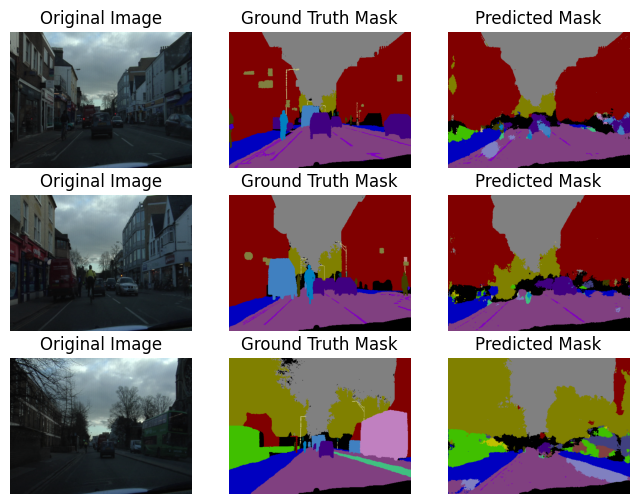


============================= Class 3 =============================
No Samples Available with 0 < IoU <= 0.5

============================= Class 4 =============================


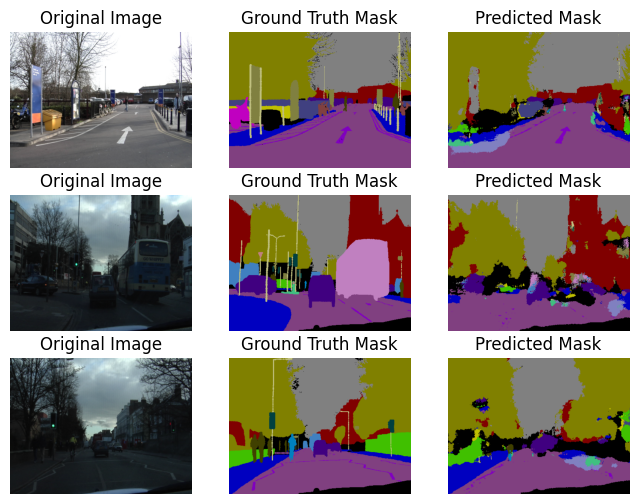


============================= Class 5 =============================


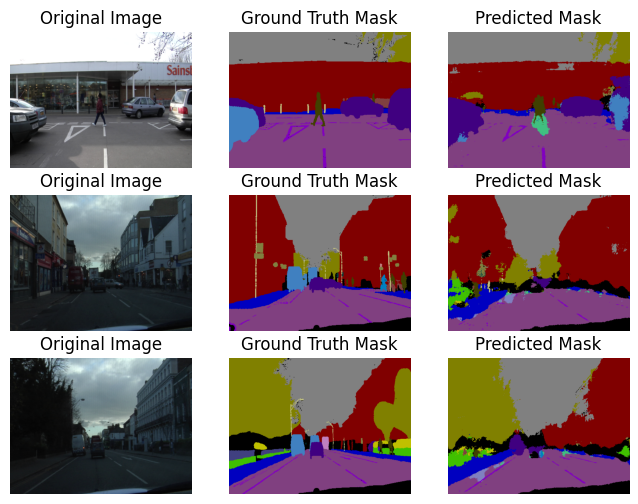


============================= Class 6 =============================
No Samples Available with 0 < IoU <= 0.5

============================= Class 7 =============================
No Samples Available with 0 < IoU <= 0.5

============================= Class 8 =============================


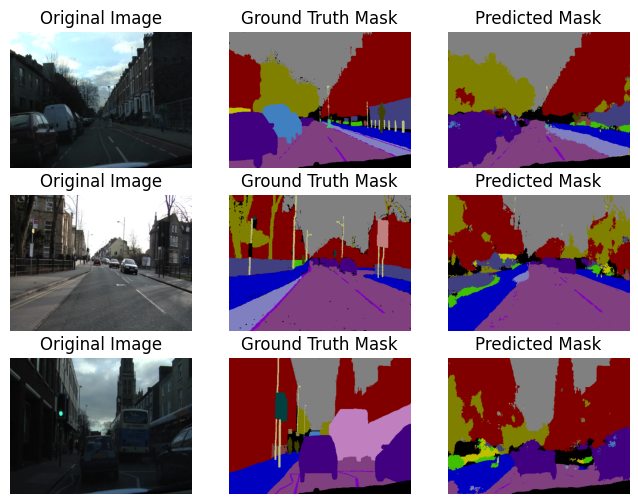


============================= Class 9 =============================


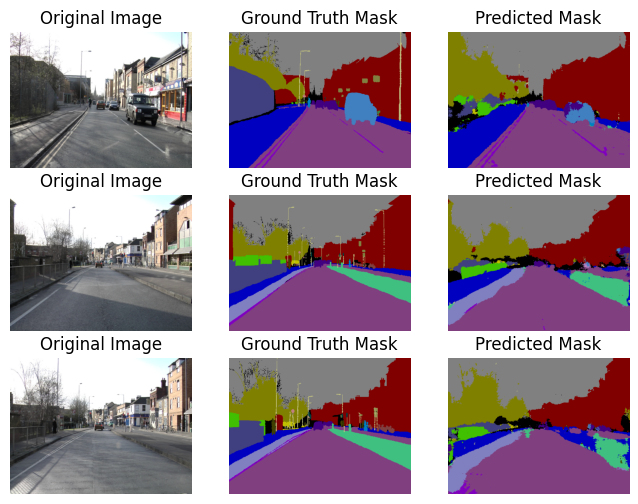


============================= Class 10 =============================


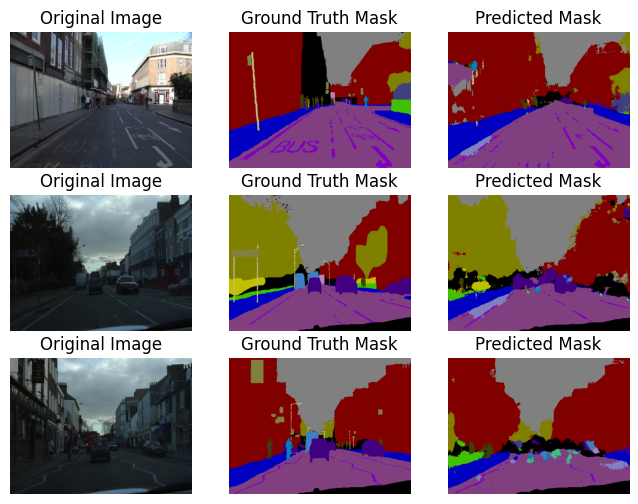


============================= Class 11 =============================
No Samples Available with 0 < IoU <= 0.5

============================= Class 12 =============================


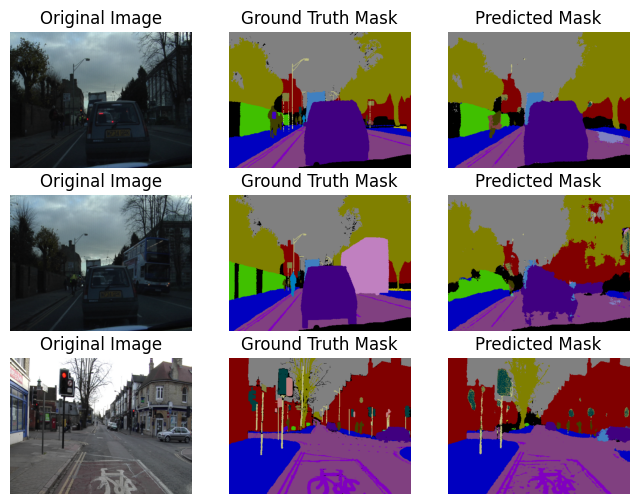


============================= Class 13 =============================
No Samples Available with 0 < IoU <= 0.5

============================= Class 14 =============================


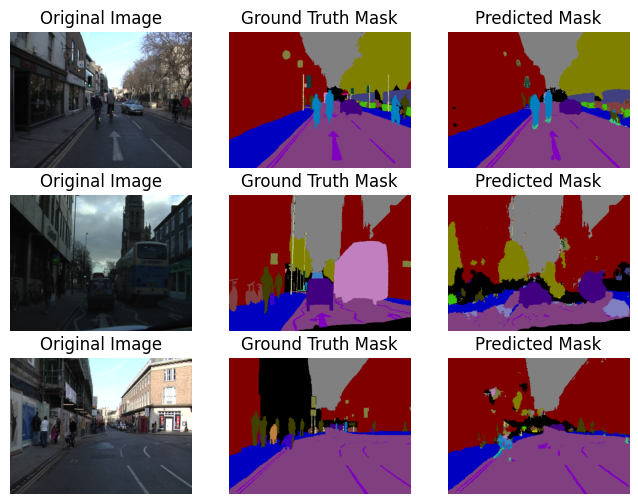


============================= Class 15 =============================


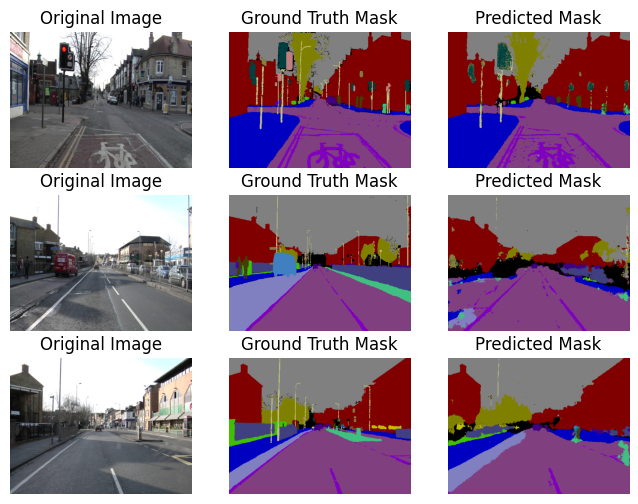


============================= Class 16 =============================


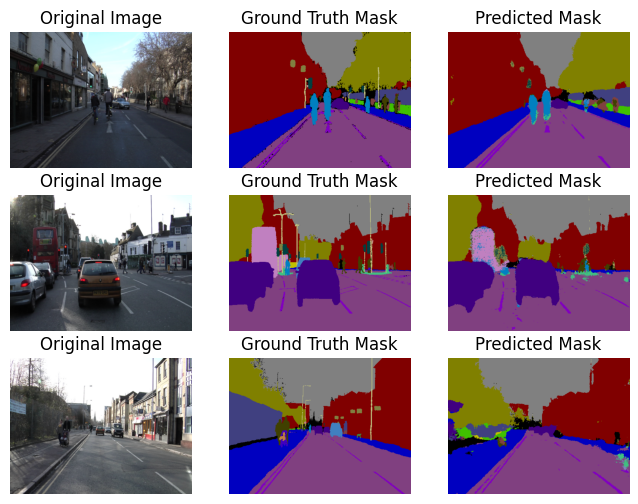


============================= Class 17 =============================


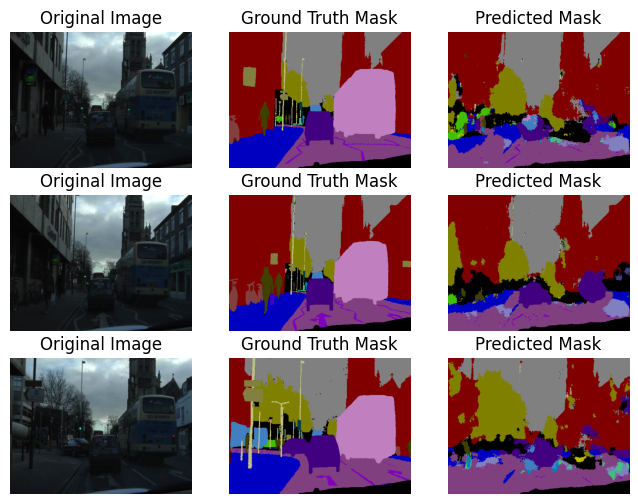


============================= Class 18 =============================


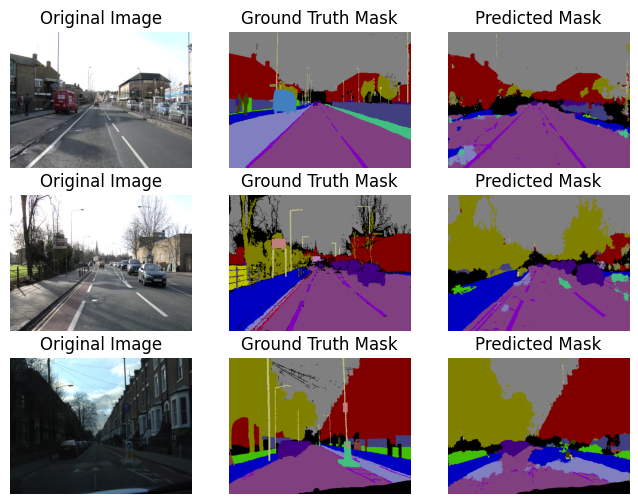


============================= Class 19 =============================


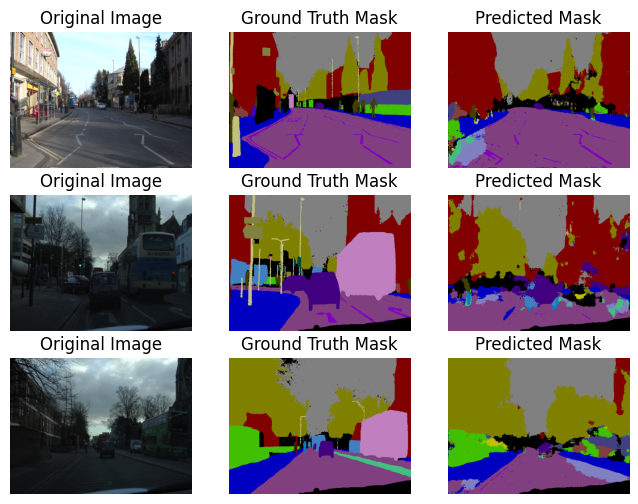


============================= Class 20 =============================


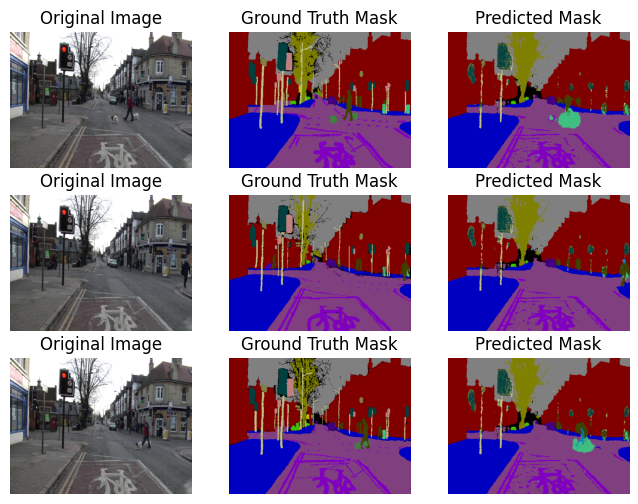


============================= Class 21 =============================
No Samples Available with 0 < IoU <= 0.5

============================= Class 22 =============================


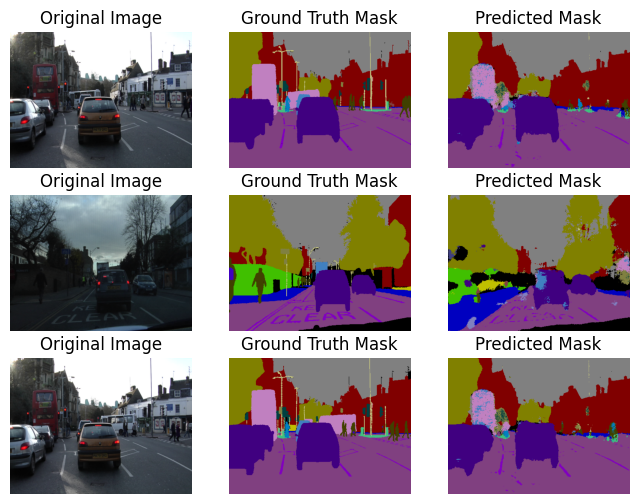


============================= Class 23 =============================
No Samples Available with 0 < IoU <= 0.5

============================= Class 24 =============================


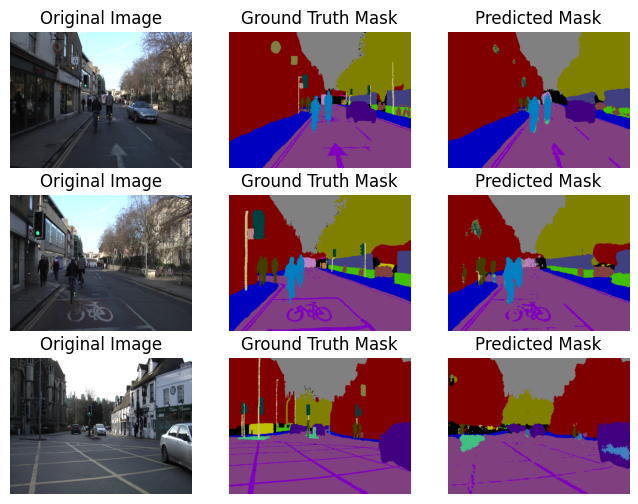


============================= Class 25 =============================
No Samples Available with 0 < IoU <= 0.5

============================= Class 26 =============================


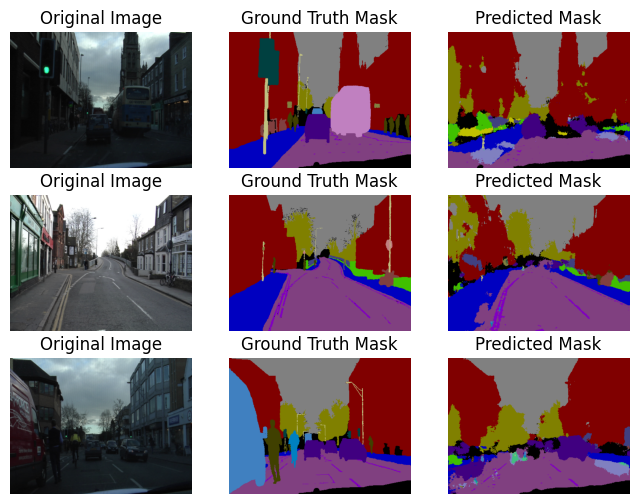


============================= Class 27 =============================


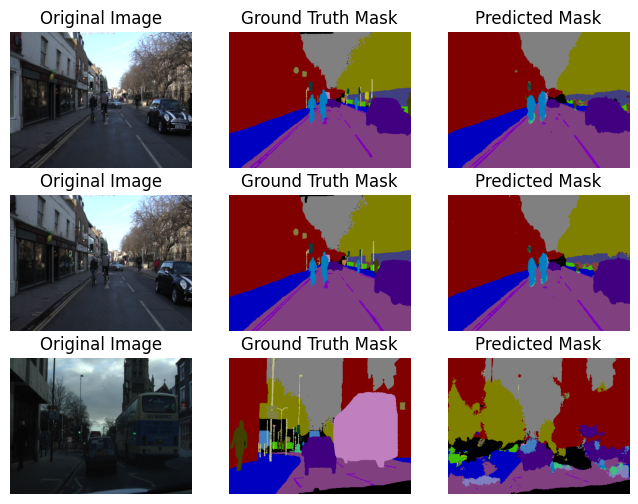


============================= Class 28 =============================
No Samples Available with 0 < IoU <= 0.5

============================= Class 29 =============================


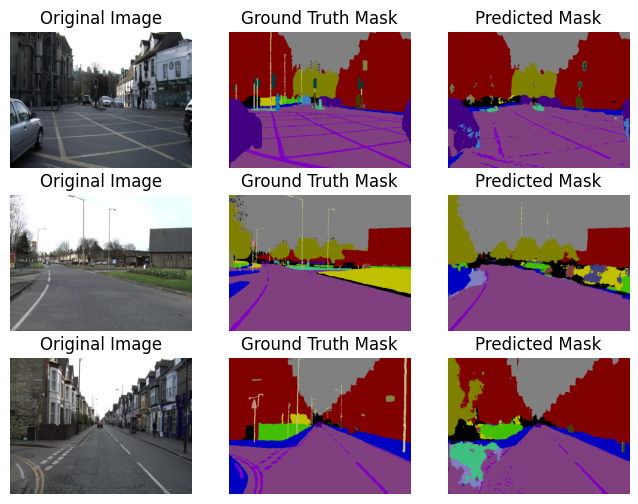


============================= Class 30 =============================


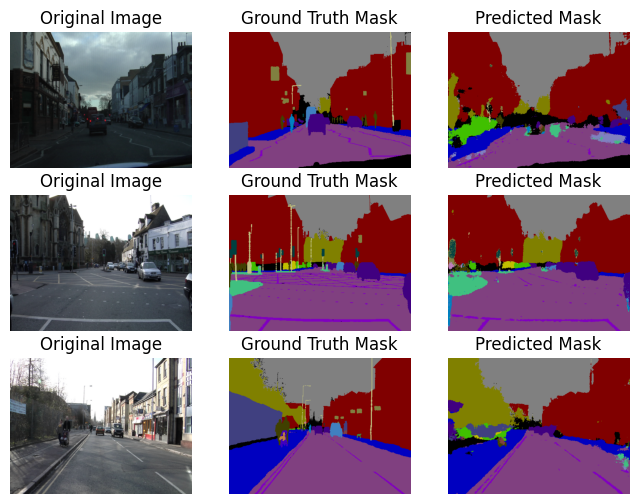


============================= Class 31 =============================


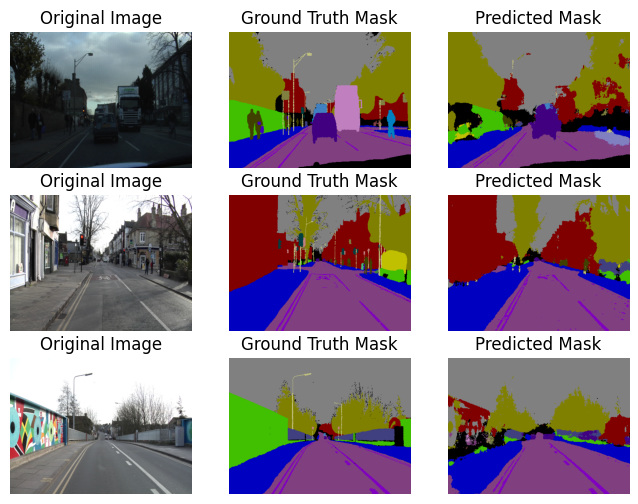

In [10]:
# Visualize models for low IoU
visualize_low_iou_samples(segnet, test_loader, num_classes=32)

# DeepLabV3 (ResNet50) : Training and Evaluation

In [11]:
# Load SegNet with Pretrained Encoder
deeplabv3 =  DeepLabV3(num_classes=32)
train(deeplabv3,train_loader,model_name="deeplabv3")

# Save only decoder weights
torch.save(deeplabv3.state_dict(), "deeplabv3.pth")
print("deeplabv3 saved successfully")

Downloading: "https://download.pytorch.org/models/deeplabv3_resnet50_coco-cd0a2569.pth" to /root/.cache/torch/hub/checkpoints/deeplabv3_resnet50_coco-cd0a2569.pth
100%|██████████| 161M/161M [00:00<00:00, 214MB/s] 


================================= TRAINING deeplabv3 =================================
Epoch [1/20] -> Train Loss: 1.8444
Epoch [2/20] -> Train Loss: 1.0057
Epoch [3/20] -> Train Loss: 0.7784
Epoch [4/20] -> Train Loss: 0.6327
Epoch [5/20] -> Train Loss: 0.5366
Epoch [6/20] -> Train Loss: 0.4672
Epoch [7/20] -> Train Loss: 0.4074
Epoch [8/20] -> Train Loss: 0.3625
Epoch [9/20] -> Train Loss: 0.3218
Epoch [10/20] -> Train Loss: 0.2863
Epoch [11/20] -> Train Loss: 0.2632
Epoch [12/20] -> Train Loss: 0.2437
Epoch [13/20] -> Train Loss: 0.2273
Epoch [14/20] -> Train Loss: 0.2134
Epoch [15/20] -> Train Loss: 0.2003
Epoch [16/20] -> Train Loss: 0.1907
Epoch [17/20] -> Train Loss: 0.1823
Epoch [18/20] -> Train Loss: 0.1756
Epoch [19/20] -> Train Loss: 0.1684
Epoch [20/20] -> Train Loss: 0.1649
================================= TRAINING COMPLETED =================================


Train Loss,█▅▄▃▃▂▂▂▂▂▁▁▁▁▁▁▁▁▁▁
Train Loss,0.16492


deeplabv3 saved successfully


In [12]:
# # Load trained DeepLabV3 model
# deeplabv3 =  DeepLabV3(num_classes=32)
# deeplabv3.load_state_dict(torch.load("deeplabv3.pth"))  # Load full model weights

# Evaluate model
deeplabv3_results = evaluate_model(deeplabv3, test_loader, num_classes=32)

Evaluating: 100%|██████████| 24/24 [00:08<00:00,  2.88it/s]



Pixel Accuracy: 0.8817
Mean IoU (mIoU): 0.3659

Class-wise Metrics:
Class 0: IoU=0.0000, Dice=0.0000, Precision=0.0000, Recall=0.0000
Class 1: IoU=0.0000, Dice=0.0000, Precision=0.0000, Recall=0.0000
Class 2: IoU=0.4604, Dice=0.6305, Precision=0.9345, Recall=0.4758
Class 3: IoU=0.2485, Dice=0.3981, Precision=0.9782, Recall=0.2499
Class 4: IoU=0.8431, Dice=0.9149, Precision=0.8773, Recall=0.9559
Class 5: IoU=0.8085, Dice=0.8941, Precision=0.8466, Recall=0.9473
Class 6: IoU=0.0000, Dice=0.0000, Precision=0.0000, Recall=0.0000
Class 7: IoU=0.0000, Dice=0.0000, Precision=0.0000, Recall=0.0000
Class 8: IoU=0.1434, Dice=0.2508, Precision=0.5185, Recall=0.1654
Class 9: IoU=0.5299, Dice=0.6928, Precision=0.6934, Recall=0.6921
Class 10: IoU=0.3887, Dice=0.5598, Precision=0.7211, Recall=0.4575
Class 11: IoU=0.0000, Dice=0.0000, Precision=0.0000, Recall=0.0000
Class 12: IoU=0.3540, Dice=0.5229, Precision=0.5947, Recall=0.4667
Class 13: IoU=0.0000, Dice=0.0000, Precision=0.0000, Recall=0.0000
Cla

Finding Low IoU Samples: 100%|██████████| 24/24 [00:09<00:00,  2.45it/s]



============================= Class 0 =============================
No Samples Available with 0 < IoU <= 0.5

============================= Class 1 =============================
No Samples Available with 0 < IoU <= 0.5

============================= Class 2 =============================


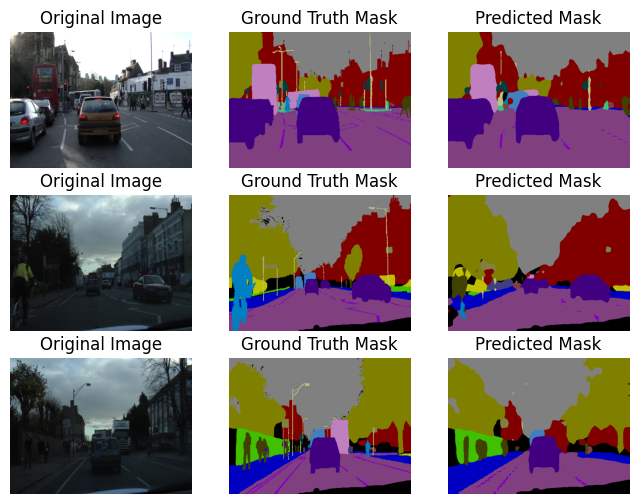


============================= Class 3 =============================


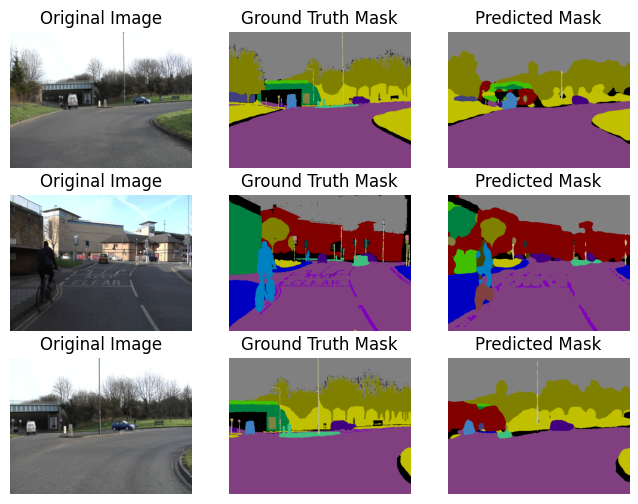


============================= Class 4 =============================


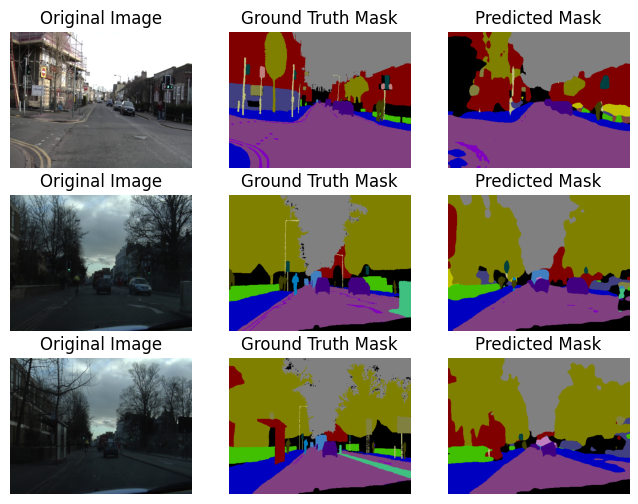


============================= Class 5 =============================


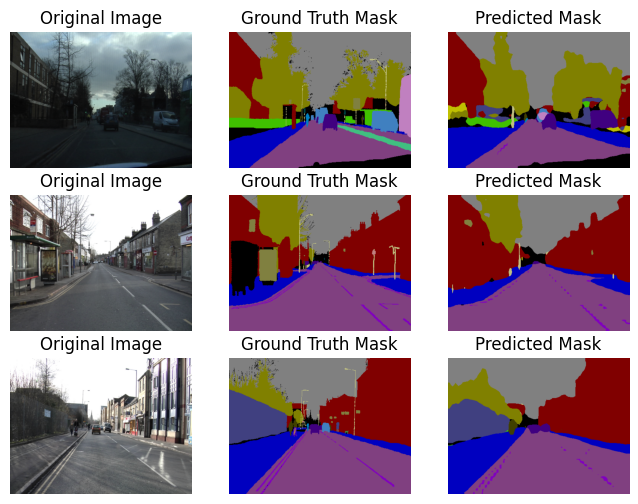


============================= Class 6 =============================
No Samples Available with 0 < IoU <= 0.5

============================= Class 7 =============================
No Samples Available with 0 < IoU <= 0.5

============================= Class 8 =============================


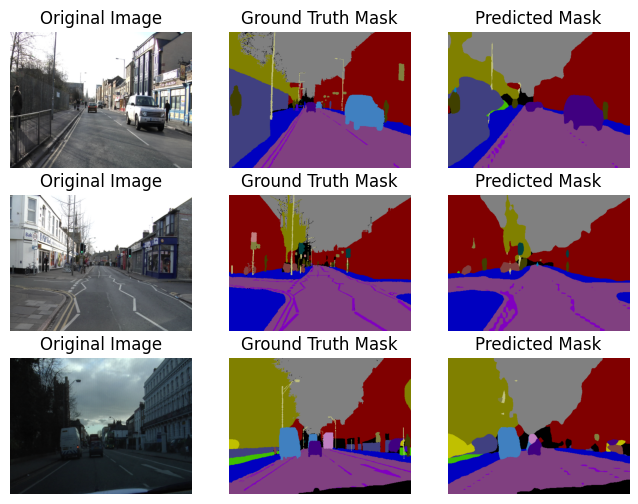


============================= Class 9 =============================


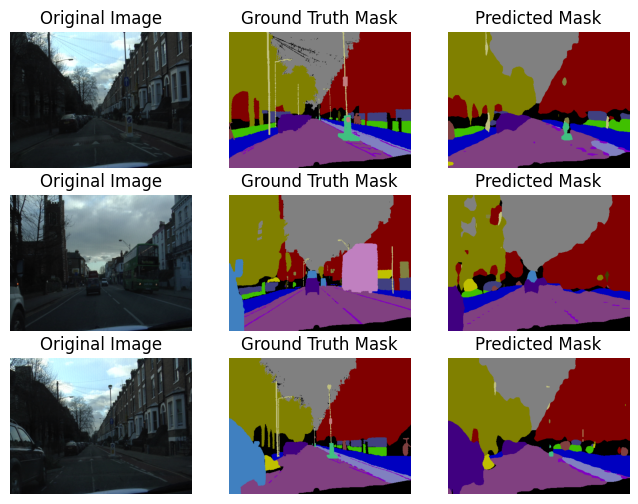


============================= Class 10 =============================


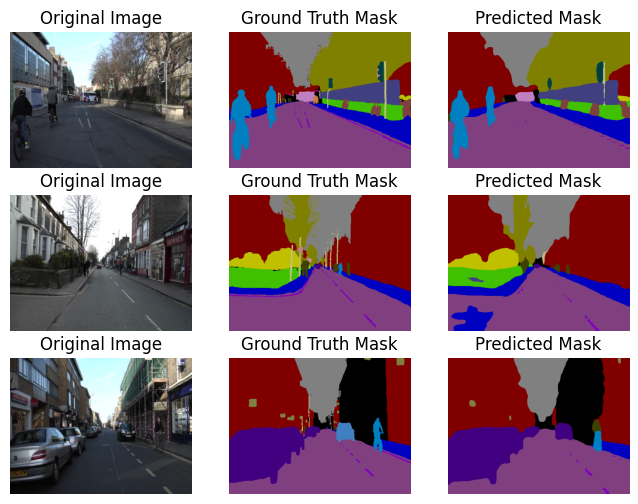


============================= Class 11 =============================
No Samples Available with 0 < IoU <= 0.5

============================= Class 12 =============================


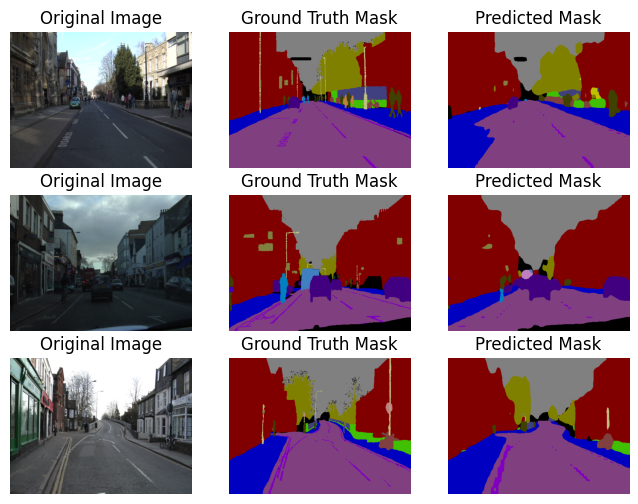


============================= Class 13 =============================
No Samples Available with 0 < IoU <= 0.5

============================= Class 14 =============================


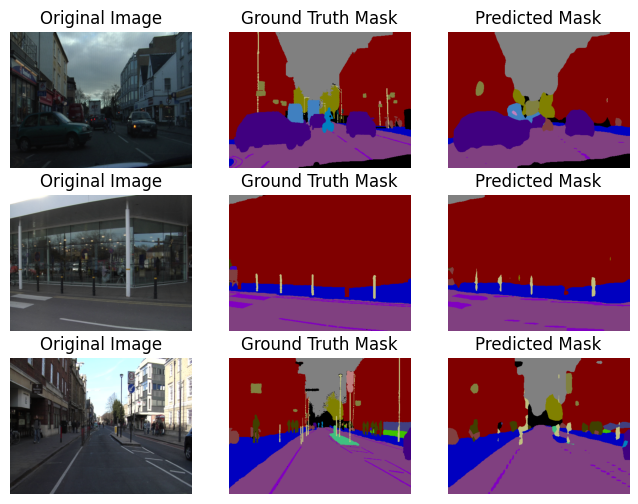


============================= Class 15 =============================


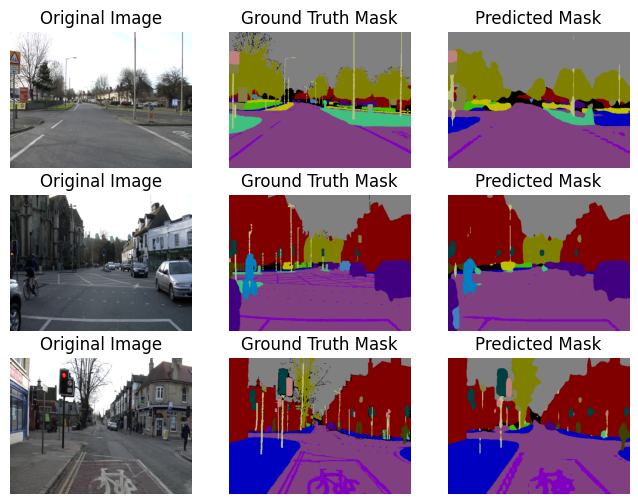


============================= Class 16 =============================


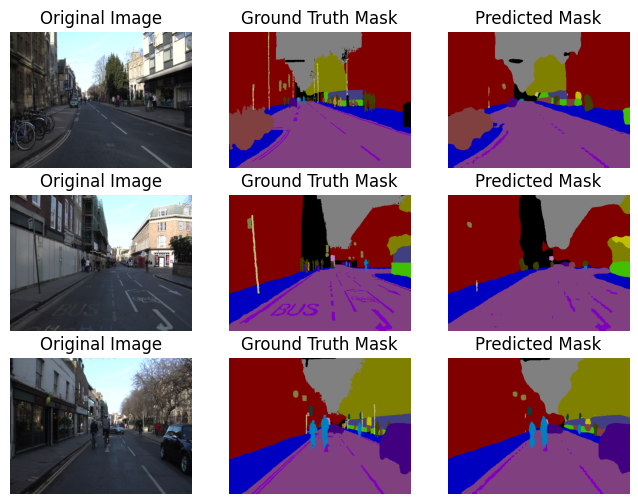


============================= Class 17 =============================
No Samples Available with 0 < IoU <= 0.5

============================= Class 18 =============================


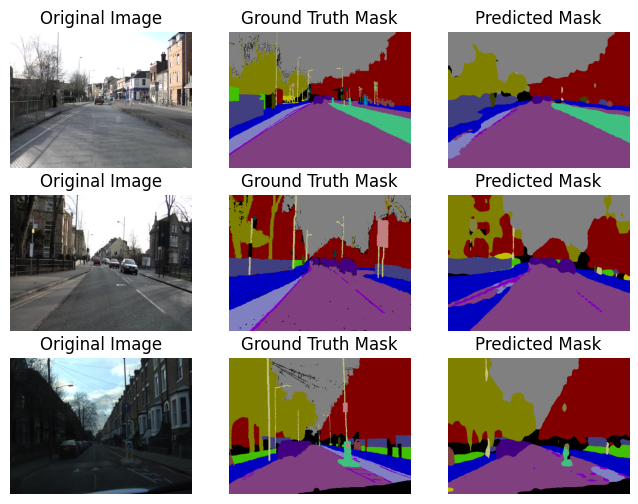


============================= Class 19 =============================


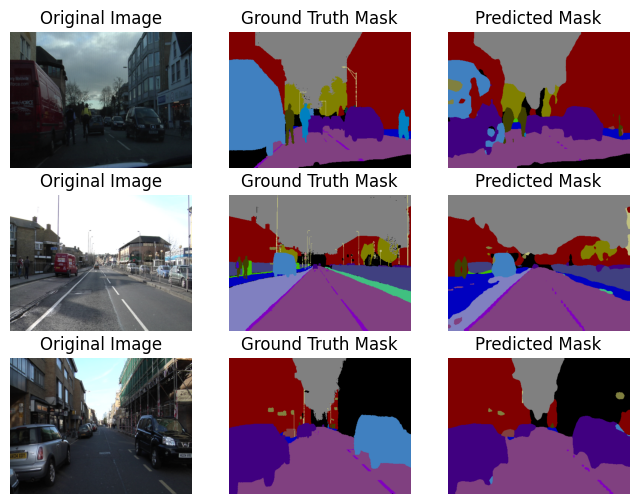


============================= Class 20 =============================


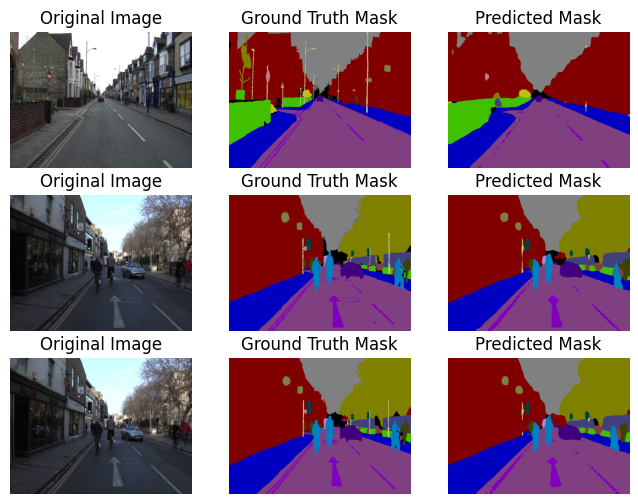


============================= Class 21 =============================
No Samples Available with 0 < IoU <= 0.5

============================= Class 22 =============================


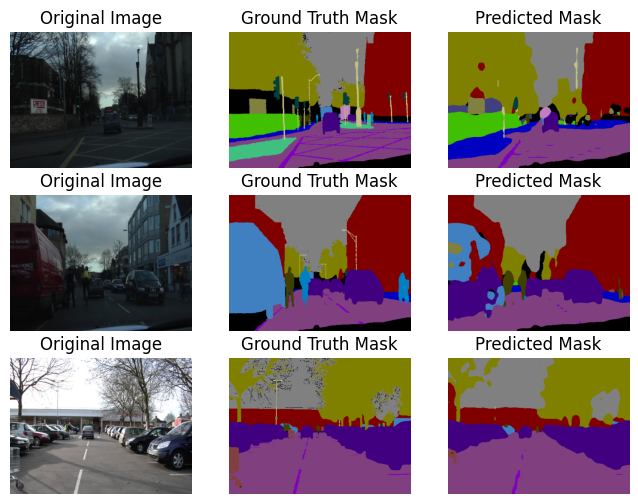


============================= Class 23 =============================
No Samples Available with 0 < IoU <= 0.5

============================= Class 24 =============================


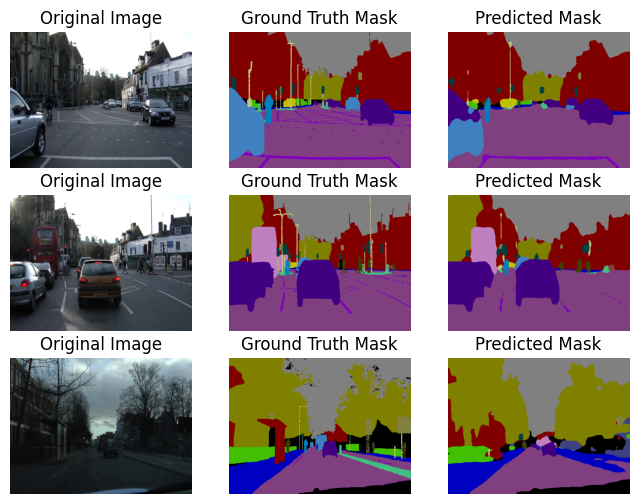


============================= Class 25 =============================
No Samples Available with 0 < IoU <= 0.5

============================= Class 26 =============================


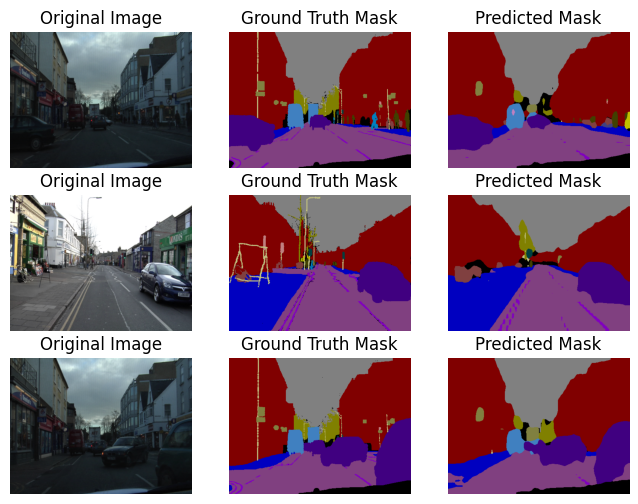


============================= Class 27 =============================


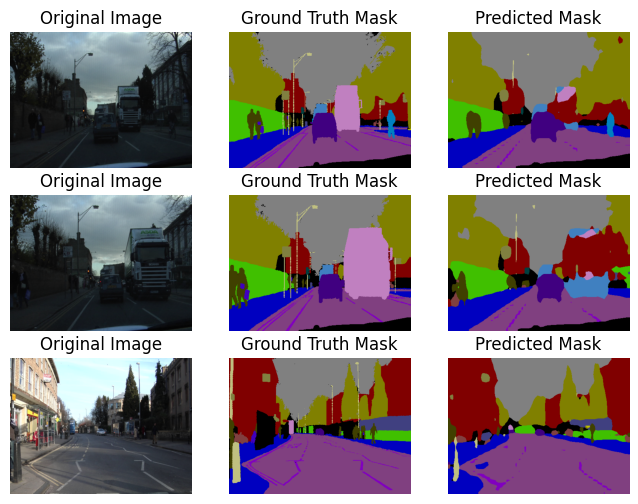


============================= Class 28 =============================
No Samples Available with 0 < IoU <= 0.5

============================= Class 29 =============================


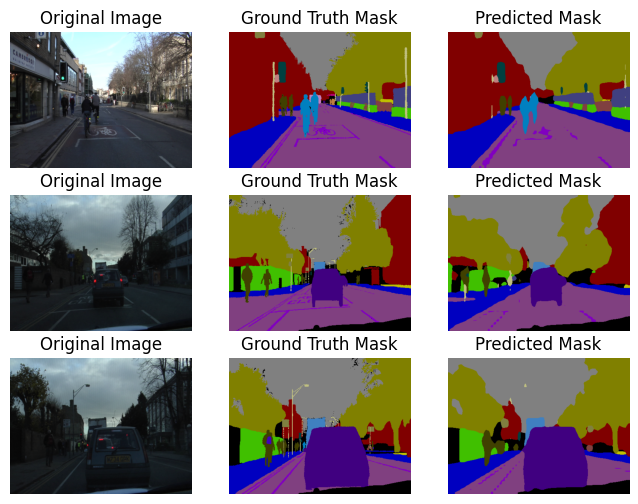


============================= Class 30 =============================


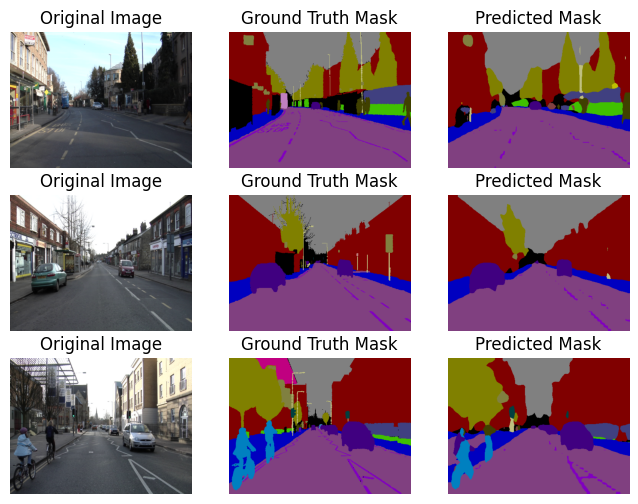


============================= Class 31 =============================


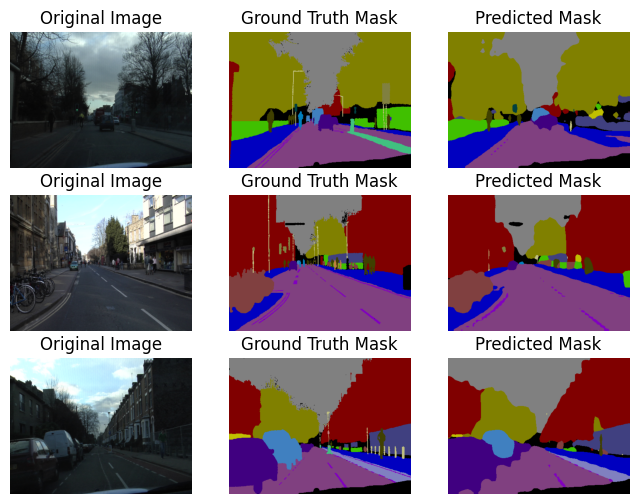

In [13]:
# Visualize models for low IoU
visualize_low_iou_samples(deeplabv3, test_loader, num_classes=32)